In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import METRICS, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS, read_files,\
    top_mean_dev_auc, top_min_whole_validation_auc, top_min_dev_auc, read_files

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
files = ['./experiments/overfit.pkl']

In [5]:
top_k = 100000

In [6]:
best_mean_dev = top_mean_dev_auc(read_files(files), top_k)
best_mean_dev.groupby(['file', 'experiment_id']).ngroups

633

In [7]:
best_min_dev = top_min_dev_auc(read_files(files), top_k)
best_min_dev.groupby(['file', 'experiment_id']).ngroups

649

In [8]:
true_best = top_min_whole_validation_auc(read_files(files), top_k)
true_best.groupby(['file', 'experiment_id']).ngroups

595

In [9]:
compare_columns = ['mean_dev_auc', 'mean_validation_auc',
               'mean_whole_validation_auc', 'max_overfit_auc',
                   'min_dev_auc', 'min_validation_auc', 'min_whole_validation_auc']

In [10]:
best_mean_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,100000.0,0.832639,0.000655,0.831666,0.832092,0.832548,0.833094,0.834691
mean_validation_auc,100000.0,0.807428,0.001453,0.801274,0.806465,0.807348,0.808453,0.812268
mean_whole_validation_auc,100000.0,0.807294,0.001776,0.799897,0.806025,0.807370,0.808603,0.812976
max_overfit_auc,100000.0,0.025293,0.003674,0.014936,0.022511,0.024696,0.027511,0.040958
min_dev_auc,100000.0,0.821706,0.001554,0.812873,0.820638,0.821759,0.822896,0.826529
min_validation_auc,100000.0,0.804089,0.001892,0.792081,0.802817,0.804053,0.805335,0.810458
min_whole_validation_auc,100000.0,0.806630,0.001919,0.797253,0.805360,0.806719,0.808019,0.812416


In [11]:
best_min_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,100000.0,0.832159,0.001216,0.826607,0.831464,0.832345,0.833041,0.834691
mean_validation_auc,100000.0,0.806736,0.001946,0.796156,0.805663,0.806829,0.807993,0.812517
mean_whole_validation_auc,100000.0,0.806510,0.002289,0.795639,0.805158,0.806648,0.808138,0.812976
max_overfit_auc,100000.0,0.027193,0.005467,0.012705,0.023153,0.026282,0.030641,0.049743
min_dev_auc,100000.0,0.822300,0.000994,0.820856,0.821456,0.822151,0.823021,0.826529
min_validation_auc,100000.0,0.803443,0.002249,0.792354,0.801991,0.803508,0.804876,0.811216
min_whole_validation_auc,100000.0,0.805917,0.002385,0.793607,0.804553,0.806079,0.807639,0.812416


In [12]:
true_best[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,100000.0,0.829109,0.004904,0.797264,0.827936,0.830006,0.831977,0.834691
mean_validation_auc,100000.0,0.807740,0.003908,0.776794,0.807601,0.808426,0.809318,0.812739
mean_whole_validation_auc,100000.0,0.809382,0.000992,0.807828,0.808633,0.809174,0.809904,0.813388
max_overfit_auc,100000.0,0.025043,0.009647,0.010824,0.020074,0.022078,0.026136,0.093333
min_dev_auc,100000.0,0.817205,0.006256,0.779868,0.815936,0.818478,0.820584,0.825546
min_validation_auc,100000.0,0.804146,0.005375,0.764719,0.804043,0.805311,0.806426,0.811216
min_whole_validation_auc,100000.0,0.808900,0.000938,0.807828,0.808182,0.808632,0.809344,0.813134


In [13]:
best = best_mean_dev

In [14]:
best.shape

(100000, 61)

In [15]:
best.groupby(SET_PARAMETERS + ['file', 'experiment_id']).size().groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       146
                    True                        147
True                False                       187
                    True                        153
dtype: int64

In [16]:
best['param_bagging_enable'] = (best.param_bagging_freq != 0)
best.groupby('param_bagging_enable').size()

param_bagging_enable
False    43080
True     56920
dtype: int64

In [17]:
best['param_feature_fraction_enable'] = (best.param_feature_fraction != 1)
best.groupby('param_feature_fraction_enable').size()

param_feature_fraction_enable
False    36275
True     63725
dtype: int64

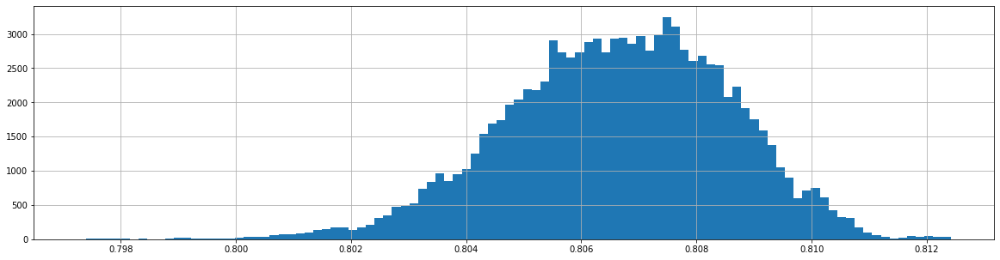

In [18]:
best.min_whole_validation_auc.hist(bins=100);

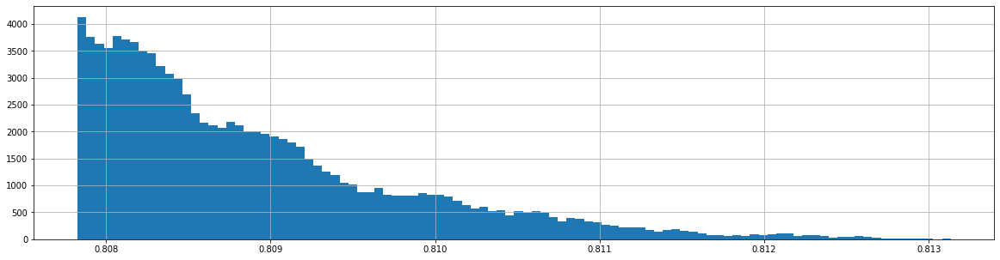

In [19]:
true_best.min_whole_validation_auc.hist(bins=100);

In [20]:
best_iteration = best.sort_values('mean_dev_auc').groupby(['file', 'experiment_id']).last()

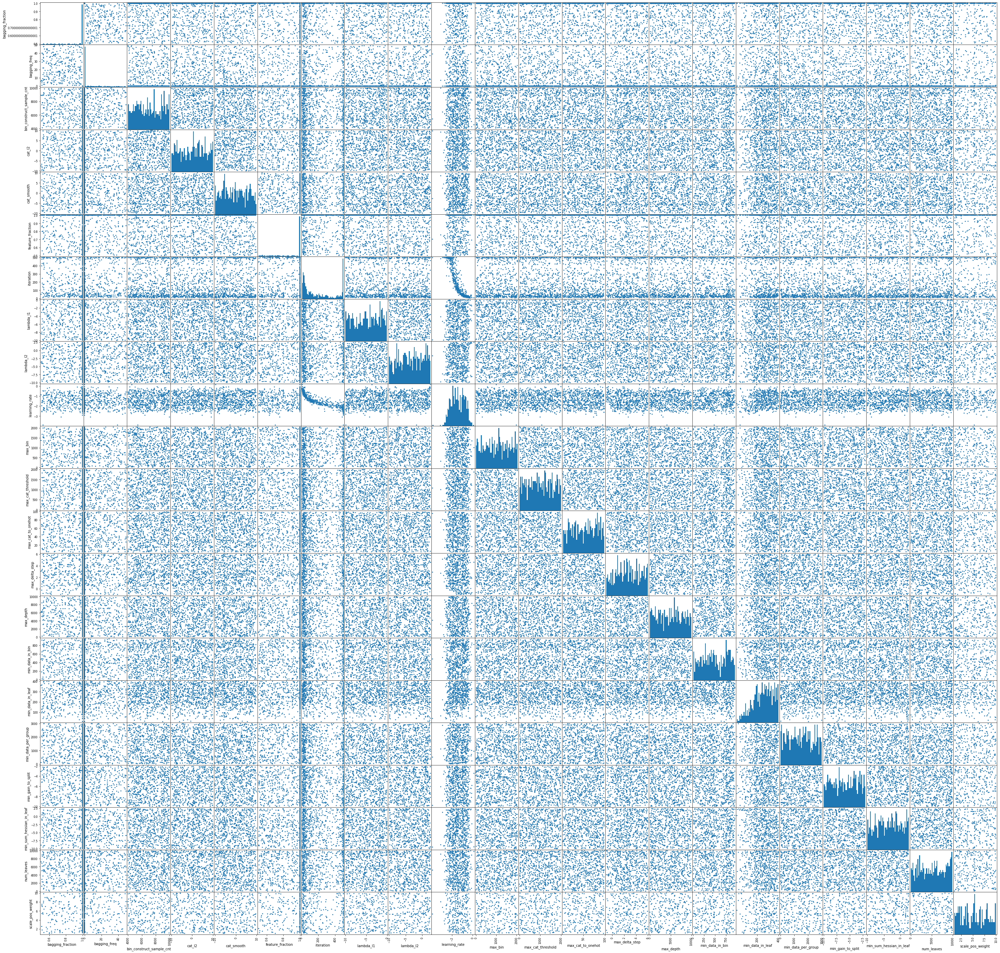

In [21]:
pd.plotting.scatter_matrix(
    pd.concat([best_iteration[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log10(best_iteration[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns').sort_index(axis=1),
    alpha=1, figsize=(50, 50), hist_kwds={'bins': 50});

### check failures in best selected parameter range

In [22]:
best_range = best\
    [[c for c in best.columns if c.startswith('param_') and not c in SET_PARAMETERS]]\
    .drop(columns=['param_seed', 'param_bagging_enable', 'param_feature_fraction_enable'])\
    .quantile([0, 1]).T
best_range

,0.0,1.0
param_bagging_fraction,5.003546e-01,1.000000e+00
param_bagging_freq,0.000000e+00,4.900000e+01
param_bin_construct_sample_cnt,4.003000e+03,9.997000e+03
param_cat_l2,1.133621e-10,9.933362e+09
param_cat_smooth,1.005836e-10,8.654698e+09
param_feature_fraction,5.015581e-01,1.000000e+00
param_lambda_l1,1.041822e-10,9.460125e-01
param_lambda_l2,1.002177e-10,3.101808e+02
param_learning_rate,1.268740e-04,1.383270e+00
param_max_bin,6.000000e+00,2.047000e+03


In [23]:
dfs = []
for f in files:
    df = pd.read_pickle(f).assign(file=f)
    for (n, l, h) in best_range.itertuples():
        df = df[(((df[n] >= l) & (df[n] <= h))
                 | df[n].isna())].copy()
    dfs.append(df)

limited = pd.concat(dfs, ignore_index=True, sort=True)
del dfs
limited.shape

(958500, 61)

In [24]:
limited_best_iteration = limited.sort_values('min_whole_validation_auc').groupby(['file', 'experiment_id']).last()
limited_best_iteration.shape

(1917, 59)

In [25]:
limited_bad = limited_best_iteration[limited_best_iteration.min_whole_validation_auc < 0.6]

In [26]:
limited_bad.shape

(8, 59)

TODO not bad

### top parameters

In [27]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(best_iteration.sort_values('mean_dev_auc', ascending=False).head(2).T)

file                                   ./experiments/overfit.pkl  \
experiment_id                                               68     
cnt                                                            3   
iteration                                                    421   
max_dev_auc                                             0.859453   
max_dev_binary_logloss                                  0.832963   
max_overfit_auc                                        0.0215657   
max_overfit_binary_logloss                              0.014947   
max_validation_auc                                      0.812035   
max_validation_binary_logloss                           0.861291   
max_whole_train_auc                                     0.844299   
max_whole_train_binary_logloss                          0.799961   
max_whole_validation_auc                                  0.8103   
max_whole_validation_binary_logloss                     0.854556   
mean_dev_auc                                    

In [ ]:
k